In [2]:
# IMPORT
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.calibration import calibration_curve
from sklearn.metrics import classification_report, confusion_matrix, cohen_kappa_score, accuracy_score, roc_curve, auc, precision_recall_curve, roc_auc_score

# FUNCTIONS
def printResults(y_test, prob, y_pred):
    # Print report
    print(classification_report(y_test, y_pred))

    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel() # If binary

    precision, recall, _ = precision_recall_curve(y_test, prob)
    auprc = auc(recall, precision)*100
    TN,FP,FN,TP = confusion_matrix(y_test, y_pred).ravel()
    specificity = TN/(TN+FP)*100
    sensitivity = TP/(TP+FN)*100
    PPV = TP/(TP+FP)*100
    NPV = TN/(TN+FN)*100

    print('---')
    kappa = cohen_kappa_score(y_test, y_pred)
    print('Cohen\'s kappa: '+ str(kappa))
    print('---')

    print('True positive: ' + str(tp))
    print('True negative: ' + str(tn))
    print('False positive: ' + str(fp))
    print('False negative: ' + str(fn))

    fpr, tpr, threshold = roc_curve(y_test, prob)
    roc_auc = auc(fpr, tpr)*100
    print()
    print('AUROC: %.1f' % roc_auc)
    print('AUPRC: %.1f' % auprc)
    print('Specificity: %.1f' % specificity)
    print('Sensitivity: %.1f' % sensitivity)
    print('PPV: %.1f' % PPV)
    print('NPV: %.1f' % NPV)
    print()
    optimal_idx = np.argmax(tpr - fpr)
    optimal_threshold = threshold[optimal_idx]
    print('Optimal threshold: ' + str(optimal_threshold))

    return roc_auc


def printConfusionMatrix(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred, labels=[1, 0])
    df_cm = pd.DataFrame(cm, index = [i for i in ['expired', 'alive']],
                  columns = [i for i in ['expired', 'alive']])
    plt.figure(figsize = (5,4))
    sns.heatmap(df_cm, annot=True, fmt="d", cmap="YlGnBu").set_ylim([0,2])
    plt.show()


def getCalibrationCurve(X, y, model, n_bins=10):
    binned_true_p, binned_predict_p = calibration_curve(y, model.predict_proba(X)[:,1], n_bins=n_bins)
    plt.scatter(binned_predict_p, binned_true_p)
    plt.title('Calibration curves')
    plt.ylabel('True')
    plt.xlabel('Predicted')


def getCalibrationCurves(models, test, predictors, n_bins=10, saveName=False):
    X_test = test[predictors]
    y_test = test['outcome']

    plt.figure(0).clf()

    for modelName in['XGB']:
        if(modelName == 'XGB'):
            binned_true_p, binned_predict_p = calibration_curve(y_test, xgb_model.predict_proba(X_test_transformed)[:, 1], n_bins=n_bins)
            plt.plot(binned_predict_p, binned_true_p, label=modelName)
        if(modelName != 'XGB'):
            binned_true_p, binned_predict_p = calibration_curve(y_test, models[modelName].predict_proba(X_test)[:,1], n_bins=n_bins)
            plt.plot(binned_predict_p, binned_true_p, label=modelName)

#     binned_true_p, binned_predict_p = calibration_curve(y_test, test['outcome'].values, n_bins=n_bins)
#     plt.plot(binned_predict_p, binned_true_p, label='APACHE')

    plt.plot([0,1], [0,1], '--', label='Perfect calibrated model')

    plt.title('Learning rate = 0.1, AUC = 0.83')
    plt.ylabel('True')
    plt.xlabel('Predicted')
    plt.legend(loc=0)

    if saveName:
        plt.savefig(saveName)
    else:
        plt.show()


def plotROC(actual, predicted):
    fpr, tpr, threshold = roc_curve(actual, predicted)
    roc_auc = auc(fpr, tpr)

    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr, tpr, 'b', label='AUC = %0.2f' % roc_auc)
    plt.legend(loc='lower right')
    plt.plot([0, 1], [0, 1], 'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()

    return roc_auc


def plotROCs(models, test, predictors, saveName=False):
    X_test = test[predictors]
    y_test = test['outcome']

    plt.figure(0).clf()

    for modelName in ['RF', 'ADA', 'LR', 'NB', 'XGB']:
        if(modelName == 'XGB'):
            prob = xgb_model.predict_proba(X_test_transformed)[:, 1]
            label = y_test
            fpr, tpr, thresh = roc_curve(label, prob)
            auc = roc_auc_score(y_test, y_pred_proba)
            plt.plot(fpr,tpr,label='%s, AUC=%.3f' % (modelName, (auc)))
            
        if(modelName != 'XGB'):
            prob = models[modelName].predict_proba(X_test)[:,1]
            label = y_test
            fpr, tpr, thresh = roc_curve(label, prob)
            auc = roc_auc_score(label, prob)
            plt.plot(fpr,tpr,label='%s, AUC=%.3f' % (modelName, (auc)))

#     prob = test['outcome'].values
#     label = np.array(test['outcome'].values).astype(int)
#     fpr, tpr, thresh = roc_curve(label, prob)
#     auc = roc_auc_score(label, prob)
#     plt.plot(fpr,tpr,label='APACHE, AUC=%.3f' % (auc))

    plt.plot([0, 0, 1], [0, 1, 1], label='Perfect discriminative model, AUC=1')

    plt.title('MIMIC-III Dataset')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')

    plt.legend(loc=0)
    if saveName:
        plt.savefig(saveName)
    else:
        plt.show()


def plotHistogram(df, variableName, title, saveName=False):
    plt.hist(df.loc[df['outcome'] == 0][variableName], bins=20, density=True, color=['blue'], alpha=1, label=['Alive'])
    plt.hist(df.loc[df['outcome'] == 1][variableName], bins=20, density=True, color=['orange'], alpha = 0.9, label=['Expired'])
    plt.xlabel(variableName)
    plt.ylabel('Density')
    plt.title(title)
    plt.legend()
    if saveName:
        plt.savefig(saveName)
    plt.show()


In [3]:
# IMPORT
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer

# FUNCTIONS
def dropNa(df, predictors, n_nan=0):
    return df.dropna(subset=predictors, thresh=len(predictors)-n_nan)


def getTrainTest(df, predictors, trainTestSplit):
    expired = list(df.loc[df['outcome'] == 1]['ID'].values)
    alive = list(df.loc[df['outcome'] == 0]['ID'].values)

    shareExpired = len(expired)/(len(expired)+ len(alive))

    trainNumberExpired = round(len(expired)*trainTestSplit)
    trainNumberAlive = round(trainNumberExpired*((len(df)/len(expired))-1))

    train_e_pid = expired[0:trainNumberExpired]
    test_e_pid = expired[trainNumberExpired:]

    train_a_pid = alive[0:trainNumberAlive]

    test_a_pid = alive[trainNumberAlive:(trainNumberAlive + round(len(test_e_pid)/(len(expired)/len(alive))))]
    a_rest = alive[trainNumberAlive + round(len(test_e_pid)/(len(expired)/len(alive))):]

    train = df[df['ID'].isin(train_e_pid + train_a_pid)]
    train = train.sample(frac=1, random_state=42)
    test = df[df['ID'].isin(test_e_pid + test_a_pid)]
    test = test.sample(frac=1, random_state=42)
    rest = df[df['ID'].isin(a_rest)]
    rest = rest.sample(frac=1, random_state=42)

    return train, test, rest


def fillNa(train, test, rest, predictors):
    imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
    imp_mean.fit(train[predictors])
    train[predictors] = pd.DataFrame(imp_mean.transform(train[predictors]), index=train[predictors].index, columns=train[predictors].columns)
    test[predictors] = pd.DataFrame(imp_mean.transform(test[predictors]), index=test[predictors].index, columns=test[predictors].columns)
    rest[predictors] = pd.DataFrame(imp_mean.transform(rest[predictors]), index=rest[predictors].index, columns=rest[predictors].columns)

    return train, test, rest


In [4]:
# from Functions.connection import conn
# from Functions.getDF import getPatientsDF
# from Functions.trainTest import dropNa, getTrainTest, fillNa
from scipy import stats
from Functions.models import getModel, getPreprocessor
# from Functions.printAndPlot import printResults, printConfusionMatrix, getCalibrationCurve, plotROC, plotROCs
import numpy as np
# import time
import shap
import pandas as pd
from sklearn.model_selection import train_test_split


# conn, query_schema = conn()

# minAge = 18
# maxAge = 100
# minLoS = 1440

# apsPredVar = [['thrombolytics', 'aids', 'hepaticfailure', 'lymphoma', 'metastaticcancer', 'leukemia', 'immunosuppression', 'cirrhosis', 'electivesurgery']]
# aps = ['intubated', 'vent', 'dialysis', 'meds'] + ['GCS', 'urine', 'wbc', 'temperature', 'respiratoryrate', 'sodium', 'heartrate', 'meanbp', 'ph', 'hematocrit', 'creatinine', 'albumin', 'pco2', 'bun', 'glucose', 'bilirubin']

categorical = ['hypertensive', 'atrialfibrillation', 'CHD with no MI', 'diabetes', 'deficiencyanemias', 'depression', 'Hyperlipemia', 'Renal failure', 'COPD']
numerical = ['ID', 'age', 'gendera', 'BMI', 'heart rate', 'Systolic blood pressure', 'Diastolic blood pressure', 'Respiratory rate', 'temperature', 'SP O2', 'Urine output', 
             'hematocrit', 'RBC', 'MCH', 'MCHC', 'MCV', 'RDW', 'Leucocyte', 'Platelets', 'Neutrophils', 'Basophils', 'Lymphocyte', 
             'PT', 'INR', 'NT-proBNP', 'Creatine kinase', 'Creatinine', 'Urea nitrogen', 'glucose', 'Blood potassium', 'Blood sodium', 
             'Blood calcium', 'Chloride', 'Anion gap', 'Magnesium ion', 'PH', 'Bicarbonate', 'Lactic acid', 'PCO2', 'EF']

predictors = numerical + categorical


df = pd.read_csv('data01.csv')
#df = getPatientsDF(conn, query_schema, minAge, maxAge, minLoS, apsPredVar)
#df.to_csv("D:\\590B\\individual-SHAP-comparison\\eICU.csv", sep='\t', encoding='utf-8')

trainTestSplit = 0.75

scoring = 'roc_auc'

train, test, rest = getTrainTest(df, predictors, trainTestSplit)
print('Train: {}, Test: {}, Rest:{}'.format(len(train), len(test), len(rest)))
    
X_train = train[predictors].copy()
X_test = test[predictors].copy()
y_train = train['outcome'].copy()
y_test = test['outcome'].copy()


# y = df.outcome
# X = df.drop(columns=['outcome','group'],axis=1)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=101)

preprocessor = getPreprocessor(numerical, categorical, X_train)

# After fitting the preprocessor, get the feature names
cat_columns = preprocessor.named_transformers_['cat']['encoder'].get_feature_names_out(categorical)
#cat_columns = preprocessor.named_transformers_['cat'].get_feature_names_out(input_features=categorical)
#cat_columns = preprocessor.named_transformers_['cat']['encoder'].get_feature_names(categorical)
X_train_transformed = pd.DataFrame(preprocessor.transform(X_train), columns=np.append(cat_columns, numerical))
X_test_transformed = pd.DataFrame(preprocessor.transform(X_test), columns=np.append(cat_columns, numerical))

modelNames = ['RF', 'ADA', 'LR', 'NB']
models = {}

for modelName in modelNames:
    model = getModel(modelName, X_train, y_train, preprocessor, scoring, randomized=True, n_iter=5)
    models[modelName] = model
    

# Get SHAP values
explainers = {}
shapValues = {}

testShap = 100 #changed from 1000, think its causing the error since the data is only 587
explainers['NB'] = shap.KernelExplainer(models['NB']['model'].predict_proba, shap.sample(X_train_transformed, testShap))
shapValues['NB'] = explainers['NB'].shap_values(X_test_transformed)

treeModels = ['RF', 'ADA'] # removed ADA because its not supported// ADA fixed
for treeModel in treeModels:
    explainers[treeModel] = shap.TreeExplainer(models[treeModel]['model'])
    shapValues[treeModel] = explainers[treeModel].shap_values(X_test_transformed)

explainers['LR'] = shap.LinearExplainer(models['LR']['model'], X_train_transformed, feature_perturbation="correlation_dependent")
shapValues['LR'] = explainers['LR'].shap_values(X_test_transformed)






Train: 881, Test: 295, Rest:0



10 fits failed out of a total of 25.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\mjema\AppData\Local\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\mjema\AppData\Local\anaconda3\Lib\site-packages\sklearn\base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\mjema\AppData\Local\anaconda3\Lib\site-packages\sklearn\pipeline.py", line 420, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "C:\Users\mjema\AppData\

  0%|          | 0/295 [00:00<?, ?it/s]

Attribute `base_estimator_` was deprecated in version 1.2 and will be removed in 1.4. Use `estimator_` instead.
The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, or maskers.Impute)


Estimating transforms:   0%|          | 0/1000 [00:00<?, ?it/s]

In [5]:
df.head(200)

,group,ID,outcome,age,gendera,BMI,hypertensive,atrialfibrillation,CHD with no MI,diabetes,...,Blood sodium,Blood calcium,Chloride,Anion gap,Magnesium ion,PH,Bicarbonate,Lactic acid,PCO2,EF
0,1,125047,0.0,72,1,37.588179,0,0,0,1,...,138.750000,7.463636,109.166667,13.166667,2.618182,7.230000,21.166667,0.500000,40.000000,55
1,1,139812,0.0,75,2,NaN,0,0,0,0,...,138.888889,8.162500,98.444444,11.444444,1.887500,7.225000,33.444444,0.500000,78.000000,55
2,1,109787,0.0,83,2,26.572634,0,0,0,0,...,140.714286,8.266667,105.857143,10.000000,2.157143,7.268000,30.571429,0.500000,71.500000,35
3,1,130587,0.0,43,2,83.264629,0,0,0,0,...,138.500000,9.476923,92.071429,12.357143,1.942857,7.370000,38.571429,0.600000,75.000000,55
4,1,138290,0.0,75,2,31.824842,1,0,0,0,...,136.666667,8.733333,104.500000,15.166667,1.650000,7.250000,22.000000,0.600000,50.000000,55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,1,169909,0.0,58,2,52.861602,0,0,0,0,...,142.875000,8.300000,93.625000,10.571429,2.320000,7.240000,42.771429,1.250000,91.000000,35
196,1,159724,1.0,89,1,18.582695,1,1,0,0,...,144.400000,8.590000,114.800000,12.500000,1.936364,7.292000,21.200000,1.260000,43.800000,75
197,1,133975,0.0,71,1,26.656324,1,0,0,0,...,143.923077,8.800000,105.692308,13.846154,2.446154,7.383529,28.384615,1.260000,46.411765,25
198,1,114524,0.0,63,2,35.599858,0,1,0,0,...,131.888889,9.262500,99.111111,16.222222,1.950000,7.323333,20.666667,1.266667,37.555556,55


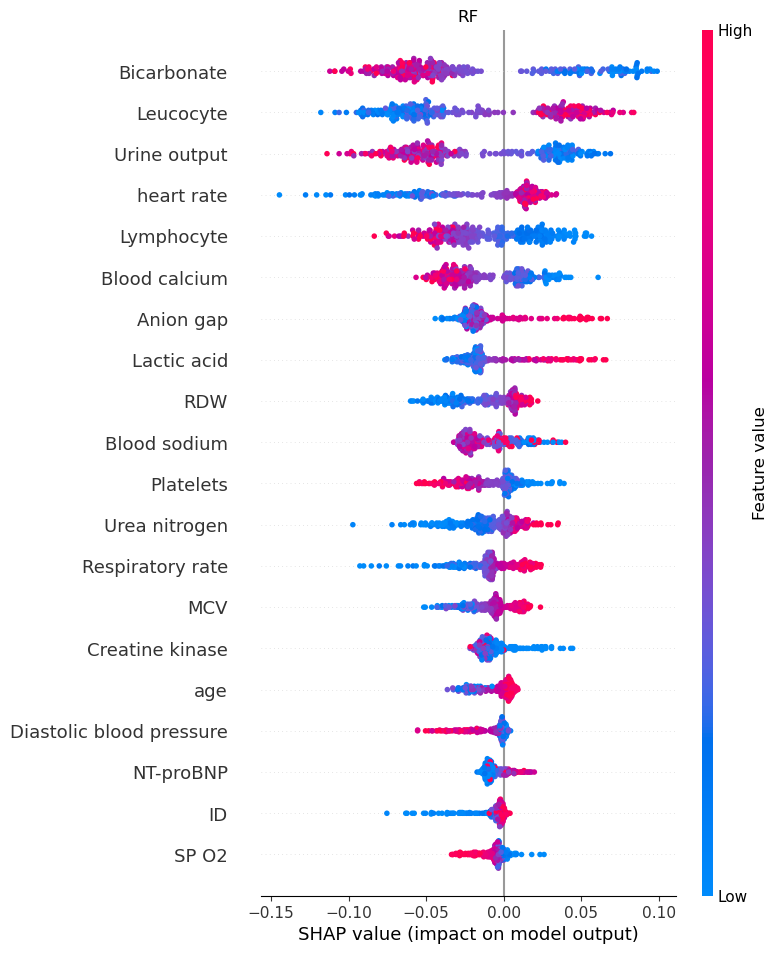

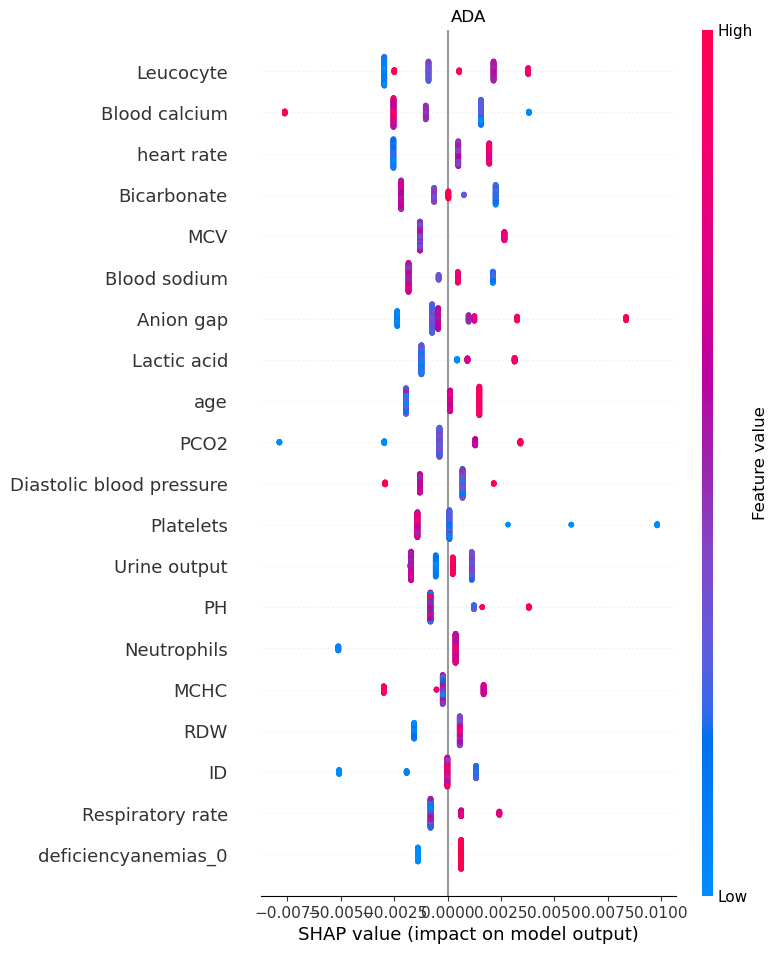

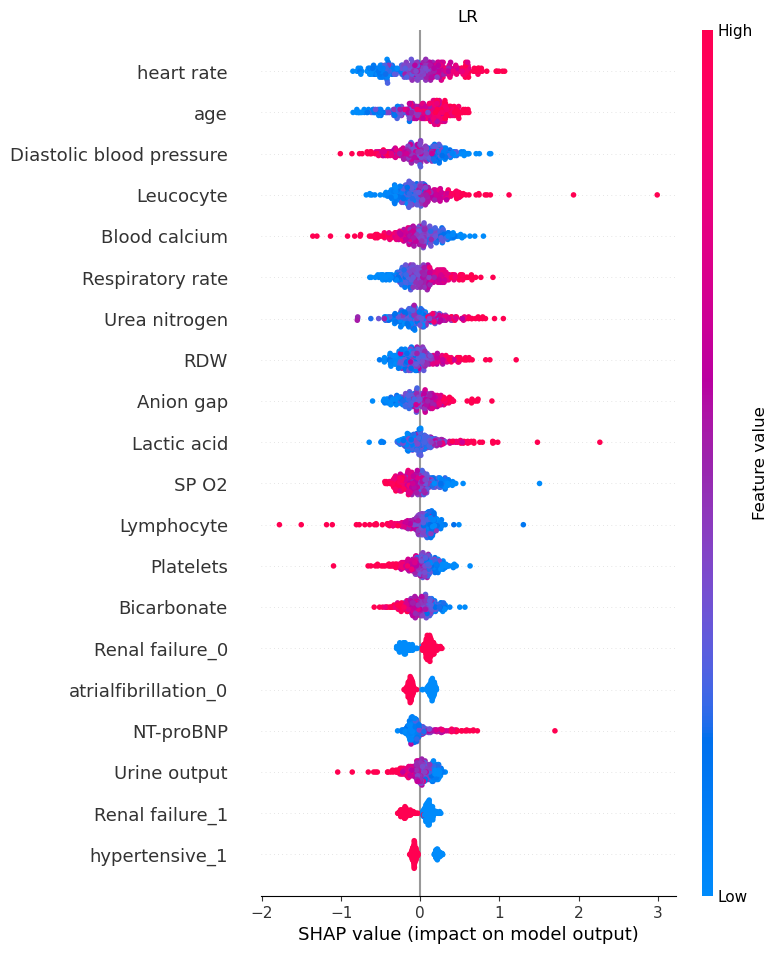

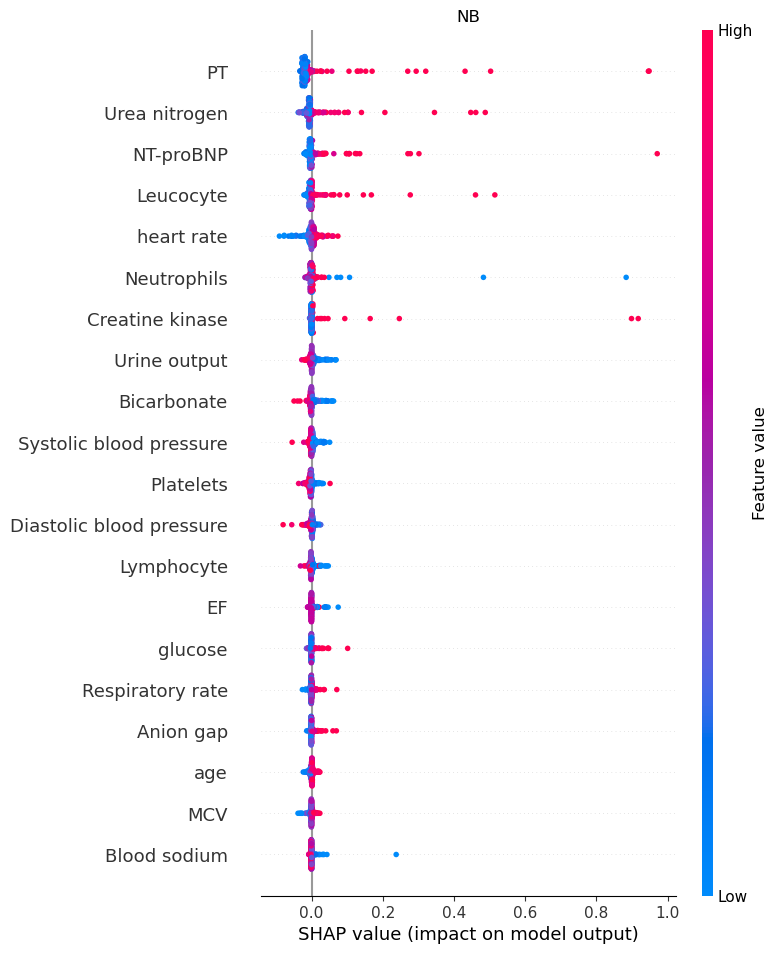

In [6]:
import matplotlib.pyplot as plt
# Loop through each model and generate a summary plot
for modelName in modelNames:
    shap_values_model = shapValues[modelName]
    expected_value_model = explainers[modelName].expected_value
    if (modelName == 'LR'):
        shap.summary_plot(shap_values_model, X_test_transformed, feature_names=X_test_transformed.columns, show=False, plot_type = 'dot')
    if (modelName != 'LR'):
        shap.summary_plot(shap_values_model[1], X_test_transformed, feature_names=X_test_transformed.columns, show=False, plot_type = 'dot')
    
    plt.title(f'{modelName}')
    plt.show()


# XGBoost

In [8]:
import xgboost as xgb
from sklearn.metrics import roc_auc_score

# Define parameters for XGBoost model
params = {
    'objective': 'binary:logistic',
    'eval_metric': 'auc',
    'max_depth': 6,  # Maximum depth of each tree
    'learning_rate': 0.01, #0.01 gives higher AUC but sets the caliration off effects observed in the shap summary plot
    'n_estimators': 100,  # Number of boosting rounds (trees)
    'subsample': 0.8,  # Subsample ratio of the training instance
    'colsample_bytree': 0.8,  # Subsample ratio of columns when constructing each tree
    'random_state': 42
}

# Train XGBoost model
xgb_model = xgb.XGBClassifier(**params)
xgb_model.fit(X_train_transformed, y_train)

# Predict probabilities for test set
y_pred_proba = xgb_model.predict_proba(X_test_transformed)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f'ROC AUC Score: {roc_auc}')


ROC AUC Score: 0.8486274509803922


In [9]:
# Predict probabilities for train set
y_train_pred_proba = xgb_model.predict_proba(X_train_transformed)[:, 1]

# Calculate binary logistic loss
binary_logistic_loss = -np.mean(y_train * np.log(y_train_pred_proba) + (1 - y_train) * np.log(1 - y_train_pred_proba))
print(f'Binary Logistic Loss: {binary_logistic_loss}')

Binary Logistic Loss: 0.23406683854022983


In [10]:
# pip install xgboost
# Calculate SHAP values for XGBoost model
explainer_XGB = shap.TreeExplainer(xgb_model)
shap_values_XGB = explainer_XGB.shap_values(X_test_transformed)


sample_idx = 200
shap.force_plot(explainer_XGB.expected_value,  # base value for class 1 (survival)
                          shap_values_XGB[sample_idx],  # SHAP values for class 1
                          np.around(X_test_transformed.iloc[index, :],decimals = 1),  # features for the selected patient
                          feature_names=X_test_transformed.columns.tolist(),
                         matplotlib = True, show = False)






# # Summary plot
# shap.summary_plot(shap_values_XGB, X_test_transformed, feature_names=X_test_transformed.columns, show=False)
# plt.title('SHAP Summary Plot')
# plt.show()

# Force plot (individual prediction)
# sample_idx = 1  # Index of the sample to visualize
# shap.force_plot(explainer_XGB.expected_value, shap_values_XGB[sample_idx], X_test_transformed[sample_idx], feature_names=X_test_transformed.columns)
# plt.title('SHAP Force Plot (Sample {})'.format(sample_idx))
# plt.show()

# # Dependence plot
# feature_idx = 0  # Index of the feature to plot
# shap.dependence_plot(feature_idx, shap_values_XGB, X_test_processed, feature_names=X_test_transformed.columns)
# plt.title('SHAP Dependence Plot (Feature {})'.format(feature_idx))
# plt.show()


[14:45:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


NameError: name 'index' is not defined

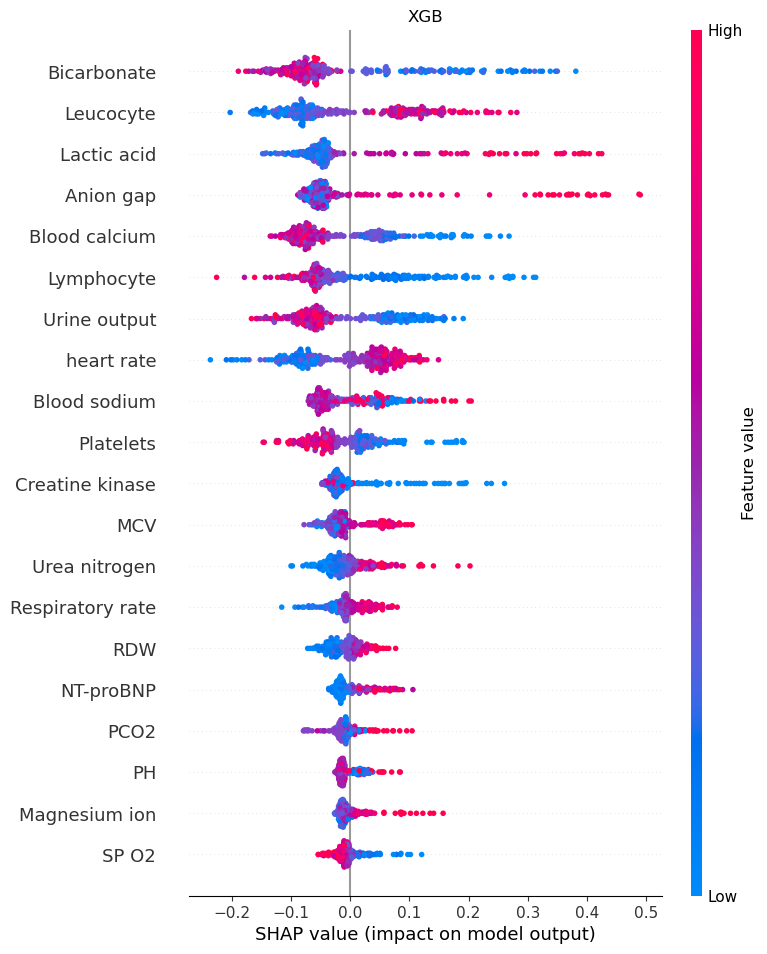

In [11]:
shap.summary_plot(shap_values_XGB, X_test_transformed, feature_names=X_test_transformed.columns, show=False, plot_type = 'dot')
plt.title(f'XGB')
plt.show()

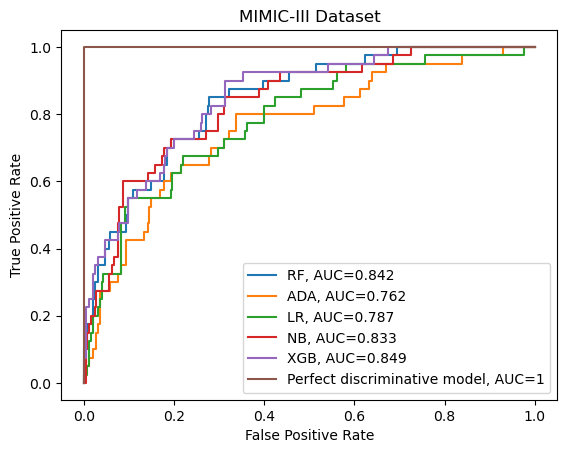

In [12]:
plotROCs(models, test, predictors, saveName=False)

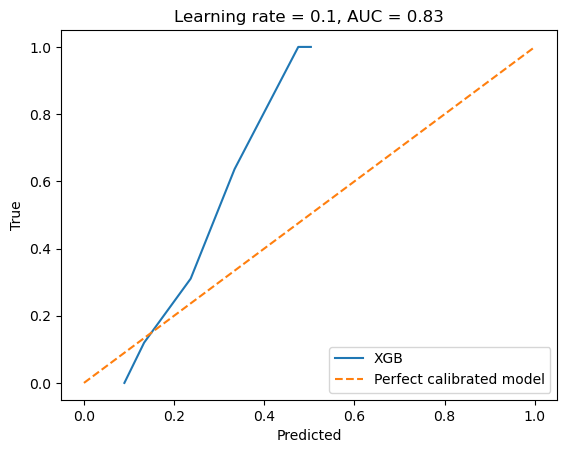

In [13]:
getCalibrationCurves(models, test, predictors, n_bins=10, saveName=False)

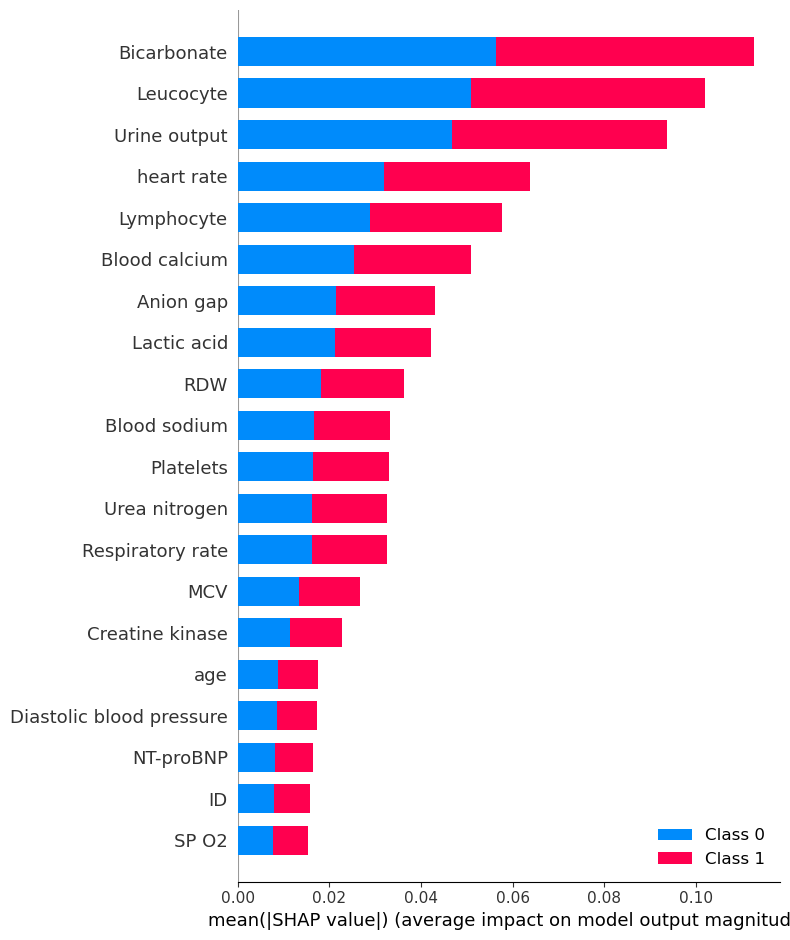

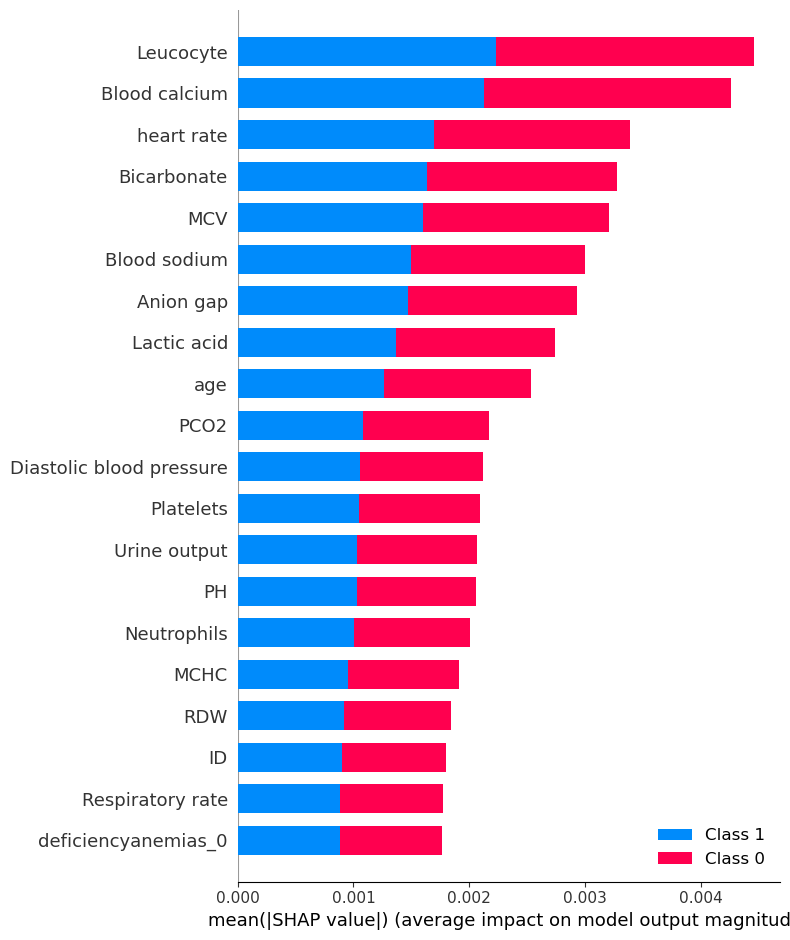

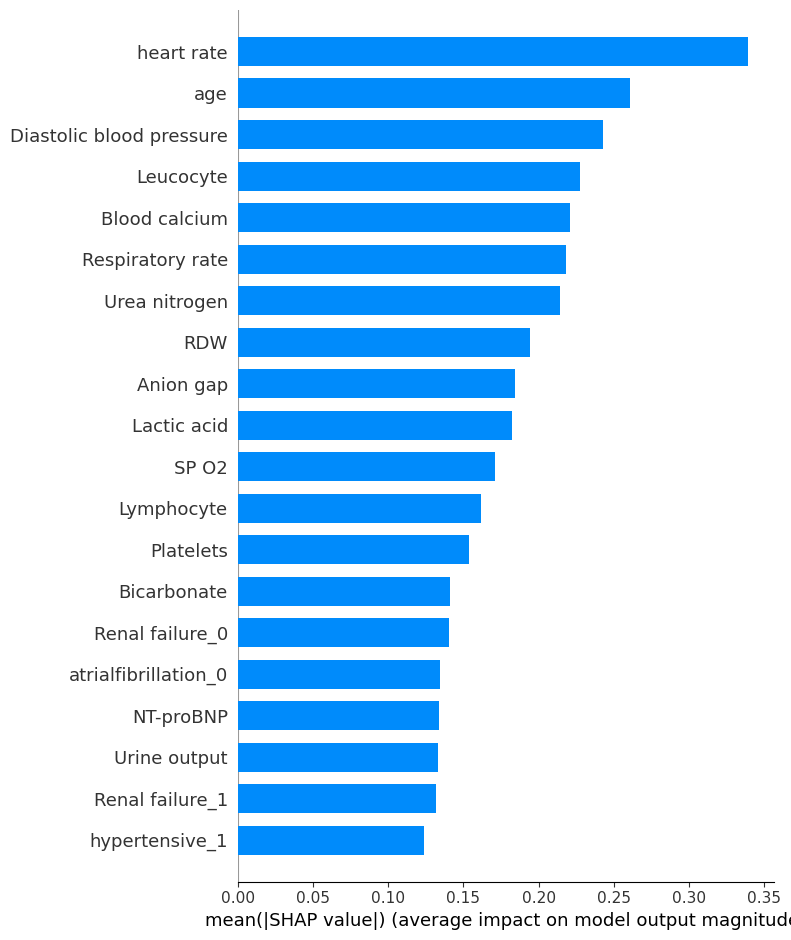

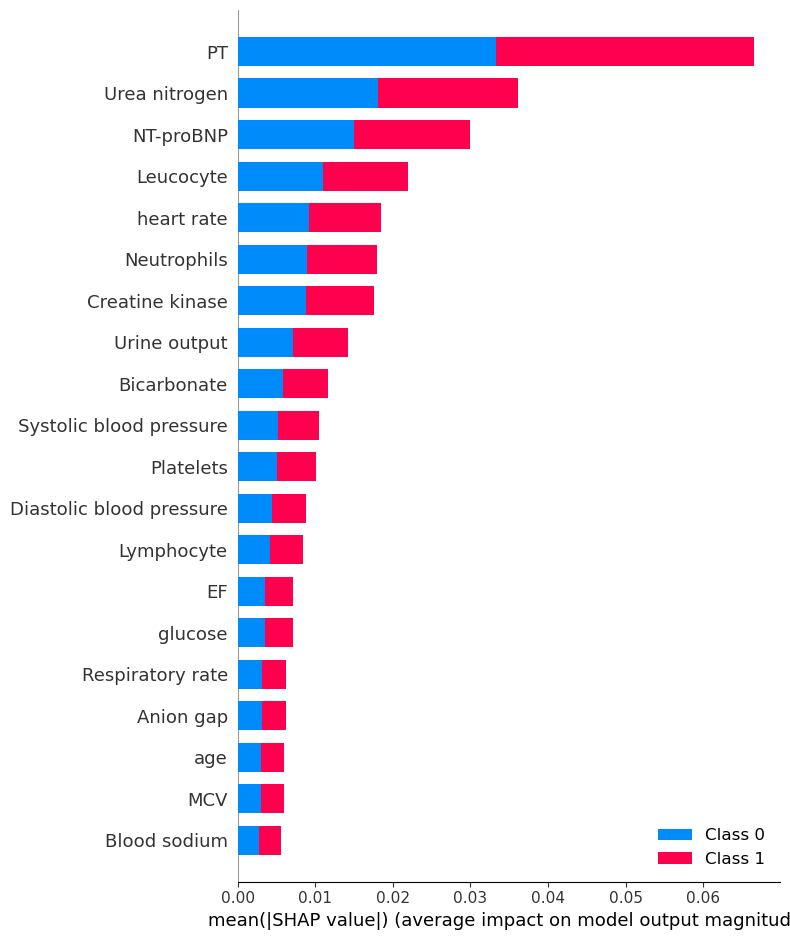

In [14]:
# Import necessary libraries
import shap

# Loop through each model and generate a summary plot
for modelName in modelNames:
    shap_values_model = shapValues[modelName]
    expected_value_model = explainers[modelName].expected_value
    shap.summary_plot(shap_values_model, X_test_transformed, feature_names=X_test_transformed.columns, show=False, plot_type='bar')
#     plt.title(f'MIMIC-III Dataset: SHAP Summary Plot - {modelName}')
    plt.show()


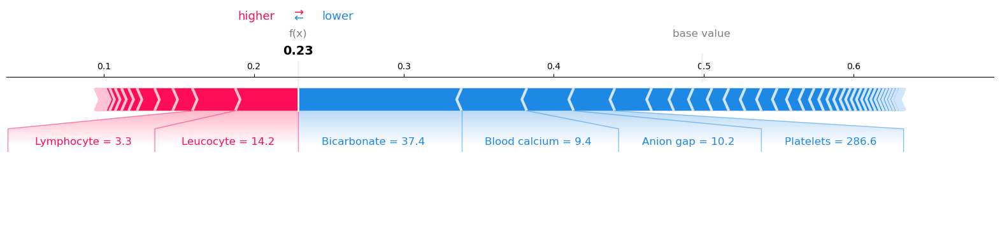

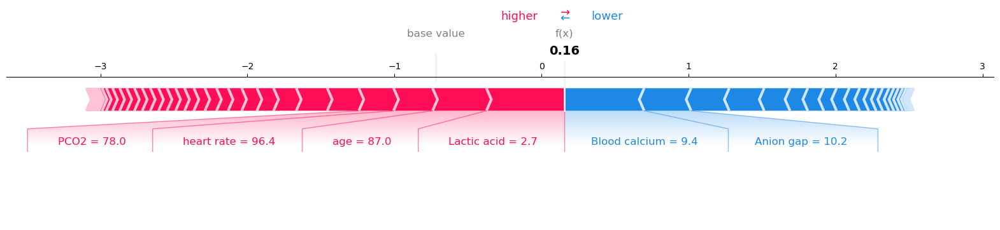

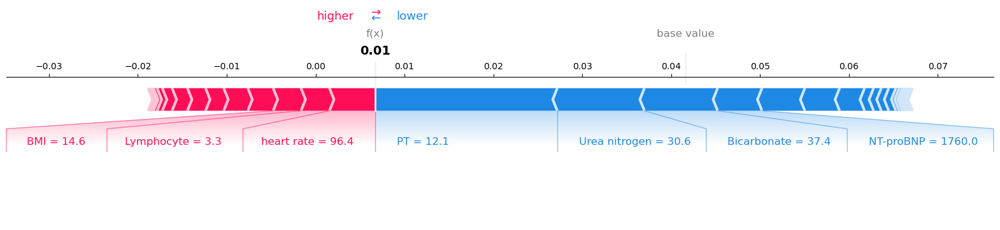

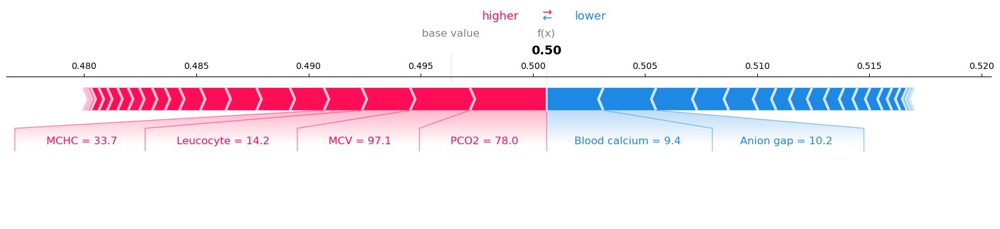

In [15]:
import shap
from IPython.display import display

# Iterate over each model
for model_name in ['RF', 'LR', 'NB', 'ADA']:
    # Choose the index of the patient for whom you want to create the SHAP force plot
    index = 157  # Replace 0 with the index of the patient you want to visualize
    
    # Create the SHAP force plot for the selected patient and model
    if isinstance(shapValues[model_name], list):
        # For multi-output models, select the first output
        shap_values = shapValues[model_name][1][index]
    else:
        shap_values = shapValues[model_name][index]

    # Retrieve the expected value
    if model_name == 'LR':
        # For logistic regression, the expected value is a scalar
        expected_value = explainers[model_name].expected_value
    else:
        # For other models, retrieve the expected value for class 1
        expected_value = explainers[model_name].expected_value[1]
    
    fig = shap.force_plot(expected_value,  # base value for class 1 (survival)
                          shap_values,  # SHAP values for class 1
                          np.around(X_test_transformed.iloc[index, :],decimals = 1),  # features for the selected patient
                          feature_names=X_test_transformed.columns.tolist(),
                         matplotlib = True, show = False)
    
    # Display the plot
    shap.initjs()
#     plt.title(f'MIMIC-III Dataset: SHAP Force Plot - {model_name}', y = 1.5)
    display(fig)


In [16]:
shap.force_plot(explainers['RF'].expected_value[1], shapValues['RF'][1], X_test_transformed)

In [17]:
shap.force_plot(explainers['LR'].expected_value, shapValues['LR'], X_test_transformed)

In [18]:
shap.force_plot(explainers['ADA'].expected_value[1], shapValues['ADA'][0], X_test_transformed)

In [20]:
shap.force_plot(explainers['NB'].expected_value[1], shapValues['NB'][0], X_test_transformed)

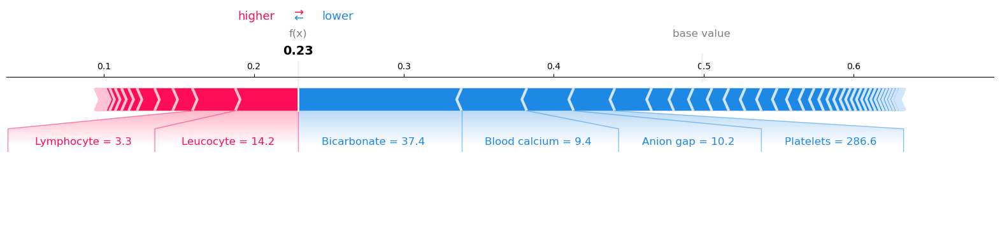

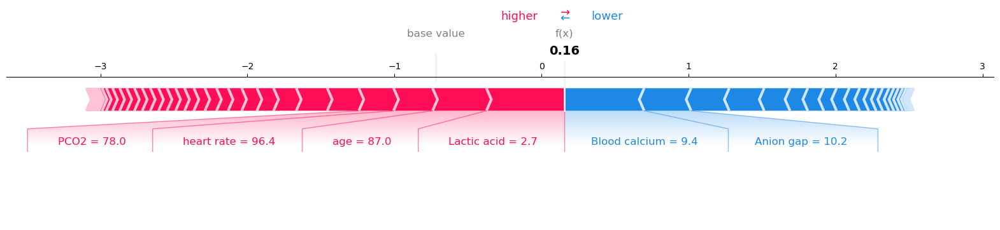

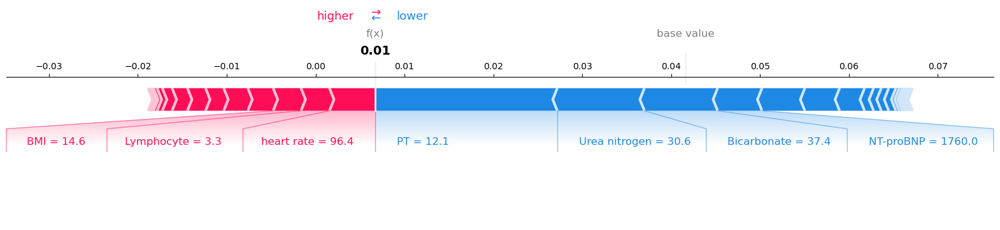

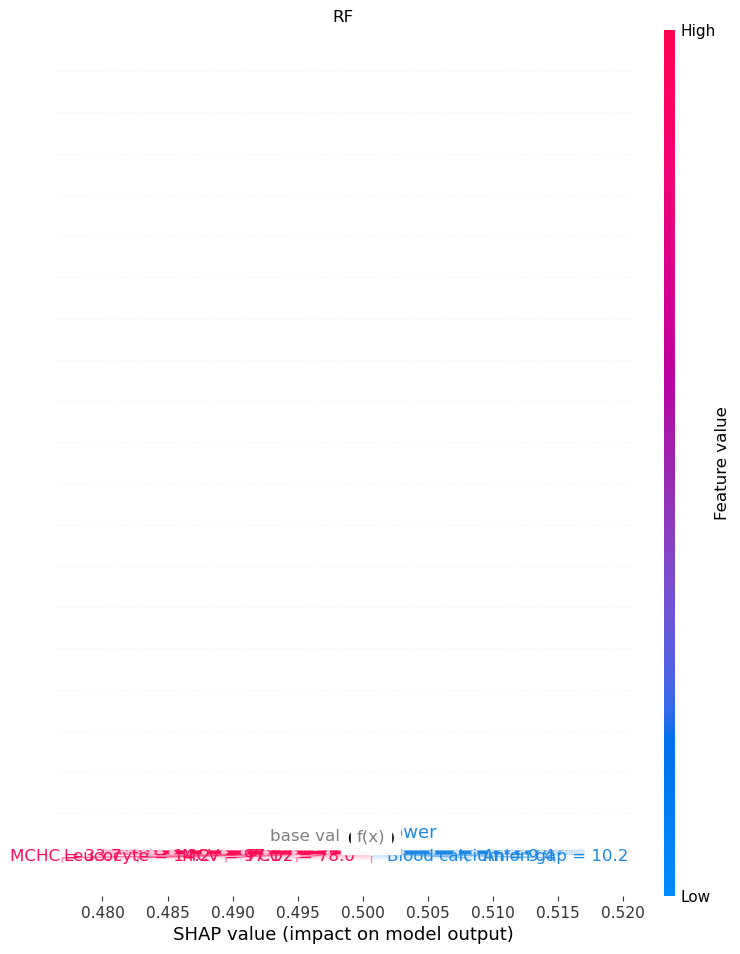

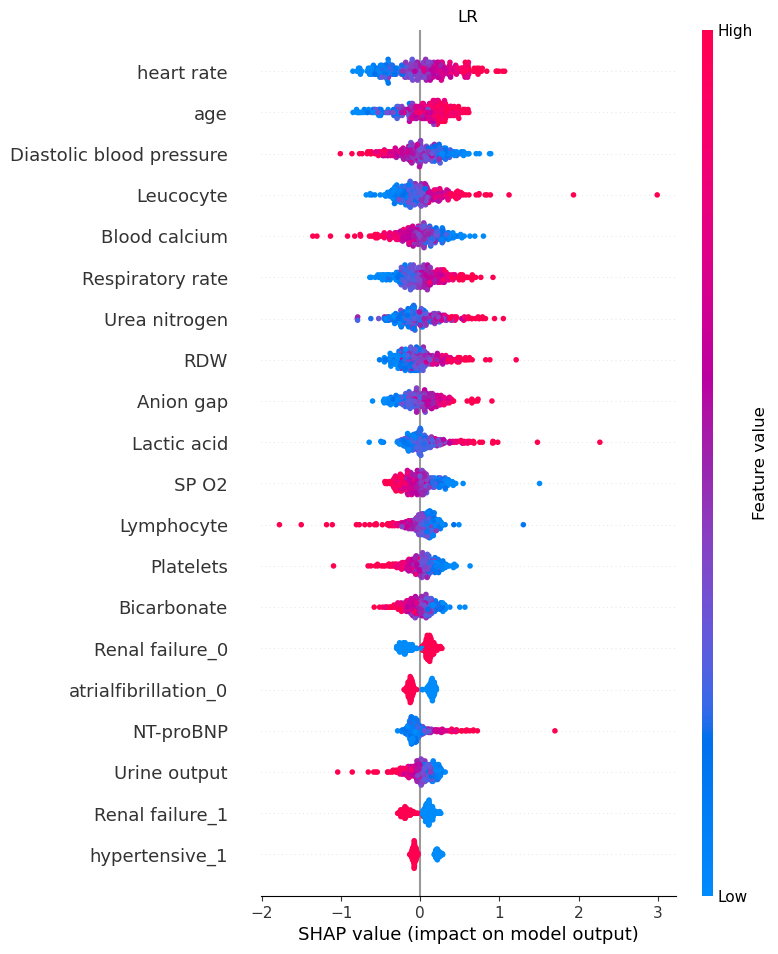

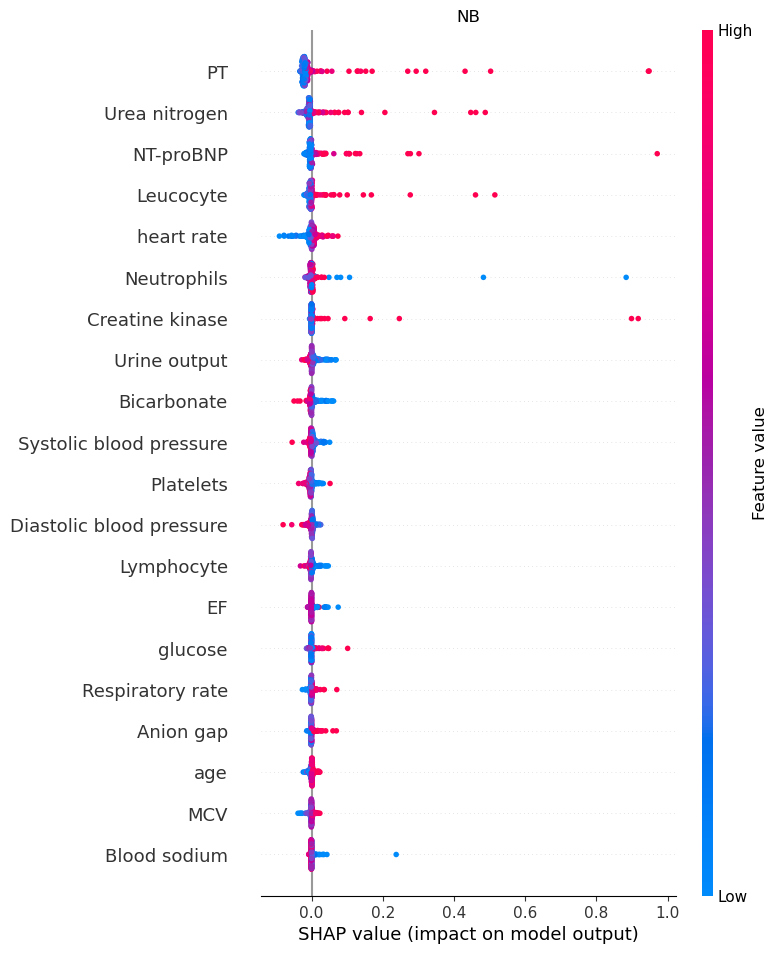

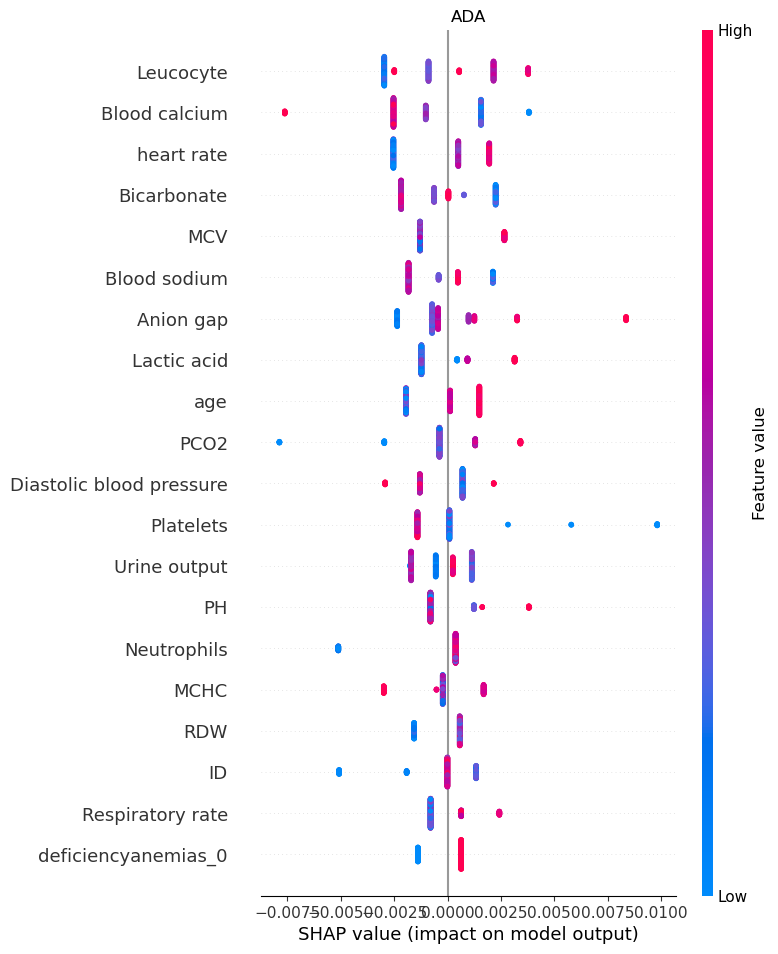

In [21]:
# import matplotlib.pyplot as plt
# Loop through each model and generate a summary plot
for modelName in [ 'RF', 'LR', 'NB', 'ADA']:
    shap_values_model = shapValues[modelName]
    expected_value_model = explainers[modelName].expected_value
    if (modelName == 'LR'):
        shap.summary_plot(shap_values_model, X_test_transformed, feature_names=X_test_transformed.columns, show=False, plot_type = 'dot')
    if (modelName != 'LR'):
        shap.summary_plot(shap_values_model[1], X_test_transformed, feature_names=X_test_transformed.columns, show=False, plot_type = 'dot')
    
    plt.title(f'{modelName}')
    plt.show()


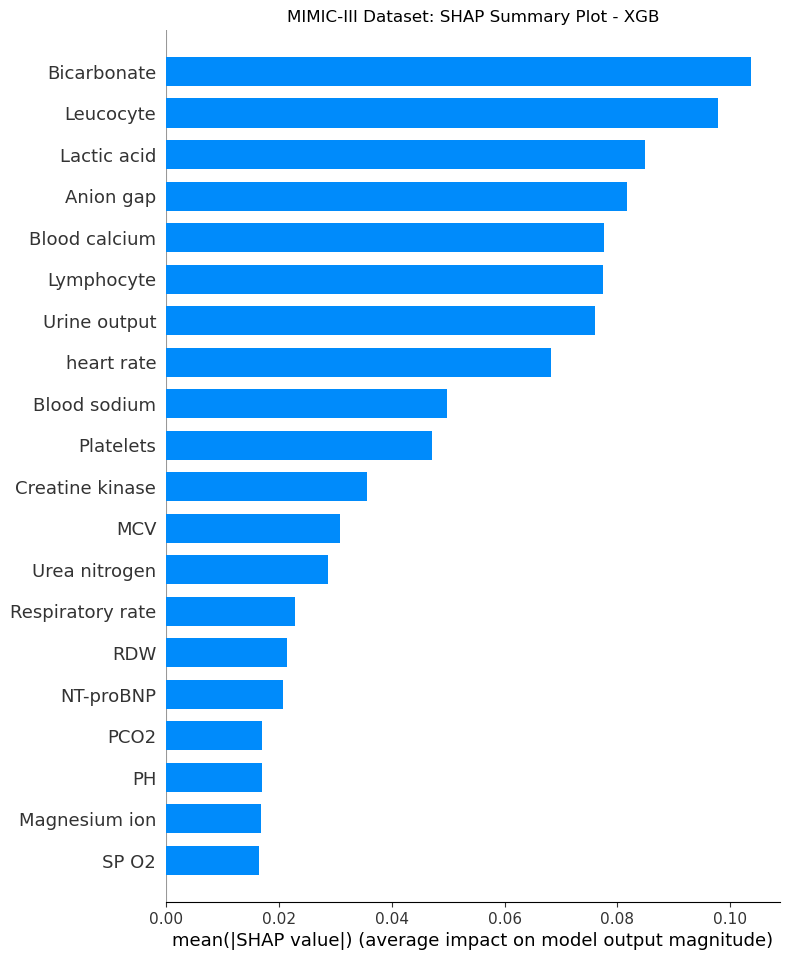

In [22]:
shap.summary_plot(shap_values_XGB,X_test_transformed,feature_names=X_test_transformed.columns, show = False, plot_type='bar')
plt.title(f'MIMIC-III Dataset: SHAP Summary Plot - XGB')
plt.show()

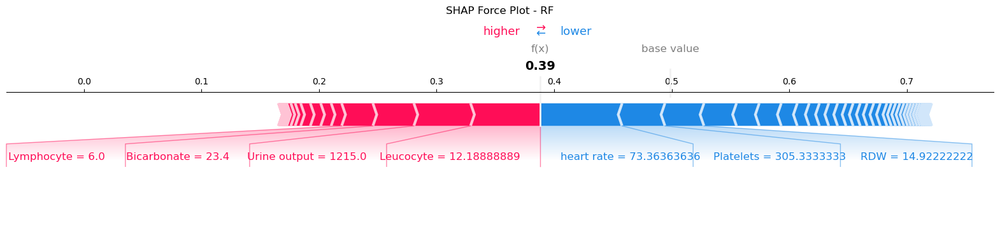

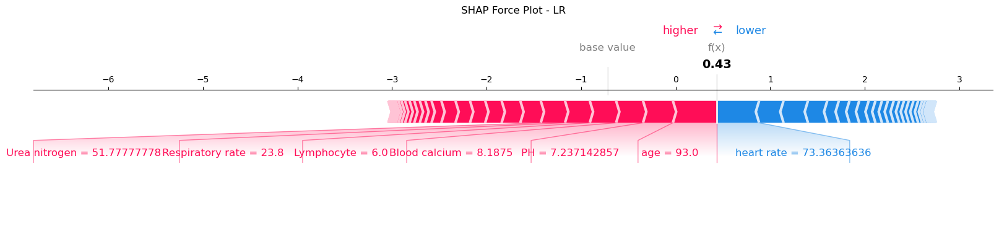

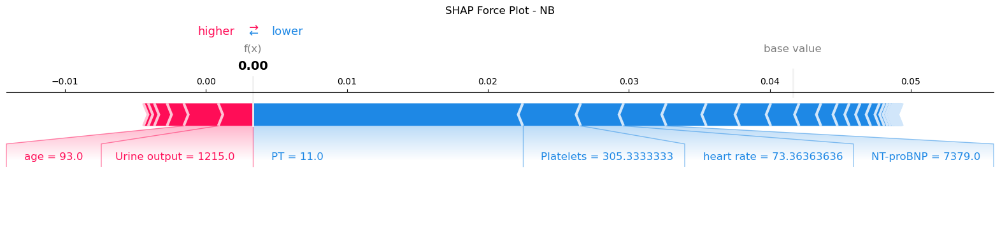

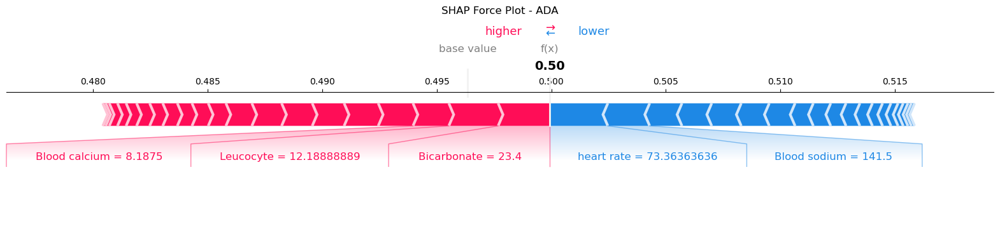

In [25]:
from IPython.display import display
import matplotlib.pyplot as plt

# Iterate over each model
for model_name in ['RF', 'LR', 'NB', 'ADA']:
    # Choose the index of the patient for whom you want to create the SHAP force plot
    index = 178 # Replace 0 with the index of the patient you want to visualize
    # 800, 80, 2014, 5000, 900
    #10, 15
    # Create the SHAP force plot for the selected patient and model
    if isinstance(shapValues[model_name], list):
        # For multi-output models, select the first output
        shap_values = shapValues[model_name][1][index]
    else:
        shap_values = shapValues[model_name][index]

    # Retrieve the expected value
    if model_name == 'LR':
        # For logistic regression, the expected value is a scalar
        expected_value = explainers[model_name].expected_value
    else:
        # For other models, retrieve the expected value for class 1
        expected_value = explainers[model_name].expected_value[1]
    
    fig = shap.force_plot(expected_value,  # base value for class 1 (survival)
                          shap_values,  # SHAP values for class 1
                          X_test_transformed.iloc[index, :],  # features for the selected patient
                          feature_names=X_test_transformed.columns.tolist(),
                         matplotlib = True, show = False)
    
    # Display the plot
    shap.initjs()
    plt.title(f'SHAP Force Plot - {model_name}', y = 1.5)
    display(fig)


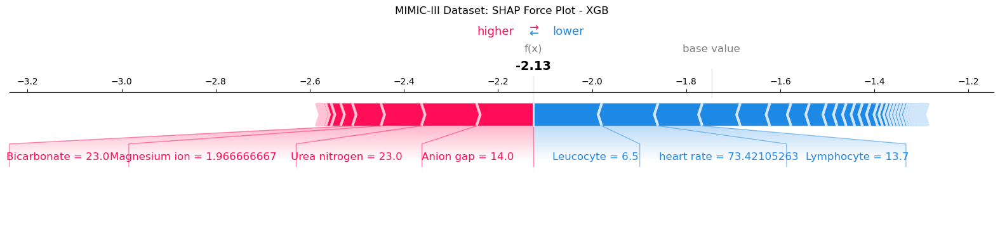

In [26]:
shap.initjs()
fig = shap.force_plot(explainer_XGB.expected_value, shap_values_XGB[0], X_test_transformed.iloc[1], feature_names=X_test_transformed.columns.tolist(), matplotlib = True, show = False)
plt.title(f'MIMIC-III Dataset: SHAP Force Plot - XGB', y = 1.5)
display(fig)

In [27]:
shap.force_plot(explainer_XGB.expected_value, shap_values_XGB, X_test_transformed)

# End